## Pipeline using heuristics and machine learning algorithms for supervised multiclass classification to map geolocation data from street sweeping to achieve high-precision sweeping behavior data (Complete example)

In this example, we will explain step-by-step how we process raw GPS data to infer sweeping behavior in the form of observations and then simulate sweeping activity. This is our goal!


### 1. Importing Libraries

To effectively analyze and visualize our data, we need to import several essential libraries. Firstly, `pandas` is imported as `pd` to handle data manipulation and analysis, providing powerful data structures like DataFrames. `numpy`, imported as `np`, is used for numerical operations, offering support for large, multi-dimensional arrays and matrices. For creating interactive plots, we import `plotly.graph_objects` as `go`. `matplotlib.pyplot`, imported as `plt`, is used for creating static, animated, and interactive visualizations in Python. We also import `train_test_split` from `sklearn.model_selection` to split our data into training and testing sets. For our machine learning model, we use `LogisticRegression` from `sklearn.linear_model`. To evaluate the model's performance, we import `accuracy_score`, `confusion_matrix`, and `classification_report` from `sklearn.metrics`. Finally, `seaborn`, imported as `sns`, is used for statistical data visualization, providing a high-level interface for drawing attractive and informative statistical graphics.

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns

**version of the libraries used**

- pandas==2.2.0
- numpy==1.25.2
- plotly==5.9.0
- matplotlib==3.7.2
- scikit-learn==1.3.0
- seaborn==0.12.2

### 2. Exploratory Analysis Phase: Speed Curve Analysis
<p> Speed is the primary predictor available to inform about the sweeping states (idle, sweeping, moving). The idea starts here because we don't have other relevant data. However, our approach will evolve with feature engineering to enhance the ability to infer sweeping behavior.

 Before exploring the data, corrections were made to the distances due to the initialization of the odometer when the sweeper engine is turned off.

In [2]:
#Importing Raw Data (only the relevant data has been saved)
df = pd.read_csv('datas/initial_data.csv', sep=';')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23239 entries, 0 to 23238
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Filename            23239 non-null  object 
 1   TimeUTC             23239 non-null  object 
 2   speed               23239 non-null  int64  
 3   Distance_Corrected  23239 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 726.3+ KB


23239 enregistrements (enregistrement chaque seconde, donc 23239 secondes = durée du shift à étudier):
- Filename : nom de la vidéo (utilisé pour vérifier et valider la classification des états de balayage (attente, balayage ou déplacement))
- TimeUTC : Temps des enregistrements, utilisé pour calculer la durée des états lors de l'application des techniques de classification et agrégation
- speed : vitesse du balai en fonction du temps (seconde) concerné
- Distance_Corrected : cet attribut a été prétraité à cause des erreurs de l'odomètre qui s'initialise lorsque le balai étaint le moteur : la correction rend continue l'enregistrement de la distance

In [4]:
df.head()

,Filename,TimeUTC,speed,Distance_Corrected
0,2019_0501_145132_801A.MP4,14:51:31,6,0.0
1,2019_0501_145132_801A.MP4,14:51:32,6,0.0
2,2019_0501_145132_801A.MP4,14:51:33,7,0.0
3,2019_0501_145132_801A.MP4,14:51:34,6,0.0
4,2019_0501_145132_801A.MP4,14:51:35,6,0.0


Visualizing Speed Over Time

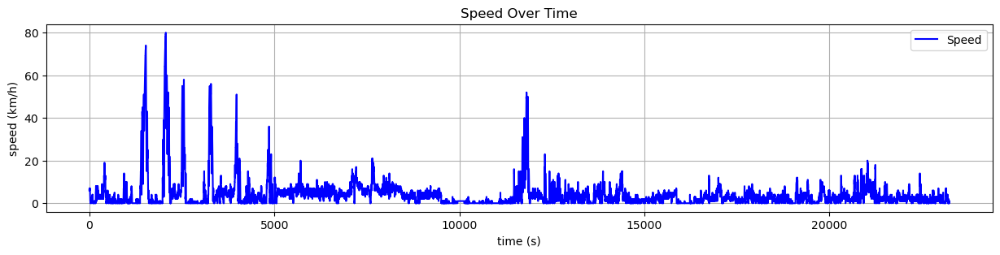

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Loading the DataFrame
df = pd.read_csv('datas/initial_data.csv', sep=';')

# Using the index as the time axis (each unit represents one second)
plt.figure(figsize=(15, 3))  # Adjusting the size as needed
plt.plot(df.index, df['speed'], label='Speed', color='blue', linestyle='-')
plt.xlabel('time (s)')
plt.ylabel('speed (km/h)')
plt.title('Speed Over Time')
plt.legend()
plt.grid(True)
plt.show()


Our objective is to transform this curve into a set of sweeping states where we can distinguish when the sweeping system is idle, sweeping, or moving. Then, we will attempt to infer the simulation parameters. Everything will be explained at the appropriate moment with the necessary details.

### 3.  Applying a smoothing heuristic to transform the speed

***Objective of Applying the Heuristic***: Correct the speed to reduce interference between sweeping states

The rapid change in speed between seconds causes significant interference between sweeping states if we initially try to distinguish between these states using speed thresholds, which is the only relevant attribute for a first classification. To reduce this interference, a smoothing heuristic was created. The goal of this heuristic is to explore the pattern of states over a 40-second period and then adjust the speed based on the average speed of the surrounding states. The corrected speed will be used for an initial classification based on this parameter. However, to calculate the average speed of the states generated by aggregation, we will use the actual speed to minimize uncertainties due to the correction of the initial speed.

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
 Input File : initial_data.csv
</div>

In [6]:
def apply_heuristic(file_path):
    # Loading the DataFrame from a CSV file
    df = pd.read_csv(file_path, sep=';')
    
    # Heuristic parameters derived from empirical estimates
    l = 1  # Lower limit
    L = 10  # Upper limit
    # CSi: corrected speed for record i
    # Si: speed for record i
    a = 0.6 # Uncertainty factor for speed in idle state (1-a: recorded speed in idle state)
    n = len(df)
    
    # Initializing the CSi column
    df['CSpeed'] = np.nan
    
    # Calculating CSi according to the rules
    for i in range(n):
        Si = df.loc[i, 'speed']
        if i < 10 or i >= n - 29:  # Correction to include the last range correctly
            CSi = Si
        else:
            ASi = df.loc[i-10:i+29, 'speed'].mean()
            if ASi > L:
                CSi = Si if Si > L else L + 1
            elif ASi <= l - a:
                CSi = 0
            elif Si <= l:
                CSi = l + 1
            else:
                CSi = Si
        df.at[i, 'CSpeed'] = CSi
    
    # Displaying the resulting DataFrame
    print(df)
    df.to_csv('datas/CSpeed_Heuristic1_Result.csv', sep=';', index=False)


# Example usage
file_path = 'datas/initial_data.csv'
apply_heuristic(file_path)


                        Filename   TimeUTC  speed  Distance_Corrected  CSpeed
0      2019_0501_145132_801A.MP4  14:51:31      6                 0.0     6.0
1      2019_0501_145132_801A.MP4  14:51:32      6                 0.0     6.0
2      2019_0501_145132_801A.MP4  14:51:33      7                 0.0     7.0
3      2019_0501_145132_801A.MP4  14:51:34      6                 0.0     6.0
4      2019_0501_145132_801A.MP4  14:51:35      6                 0.0     6.0
...                          ...       ...    ...                 ...     ...
23234  2019_0502_015846_969A.MP4  01:59:25      0                35.7     0.0
23235  2019_0502_015846_969A.MP4  01:59:26      0                35.7     0.0
23236  2019_0502_015846_969A.MP4  01:59:27      0                35.7     0.0
23237  2019_0502_015846_969A.MP4  01:59:28      0                35.7     0.0
23238  2019_0502_015846_969A.MP4  01:59:29      1                35.7     1.0

[23239 rows x 5 columns]


We notice that a new column has been added for the corrected speed.

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Output File : CSpeed_Heuristic1_Result.csv
</div>

***Now we will explore the impact of the speed correction by overlaying the speed curves over time, with both the initial and corrected speeds.***

In [7]:
df1 = pd.read_csv('datas/CSpeed_Heuristic1_Result.csv', sep=';')
df1

,Filename,TimeUTC,speed,Distance_Corrected,CSpeed
0,2019_0501_145132_801A.MP4,14:51:31,6,0.0,6.0
1,2019_0501_145132_801A.MP4,14:51:32,6,0.0,6.0
2,2019_0501_145132_801A.MP4,14:51:33,7,0.0,7.0
3,2019_0501_145132_801A.MP4,14:51:34,6,0.0,6.0
4,2019_0501_145132_801A.MP4,14:51:35,6,0.0,6.0
...,...,...,...,...,...
23234,2019_0502_015846_969A.MP4,01:59:25,0,35.7,0.0
23235,2019_0502_015846_969A.MP4,01:59:26,0,35.7,0.0
23236,2019_0502_015846_969A.MP4,01:59:27,0,35.7,0.0
23237,2019_0502_015846_969A.MP4,01:59:28,0,35.7,0.0


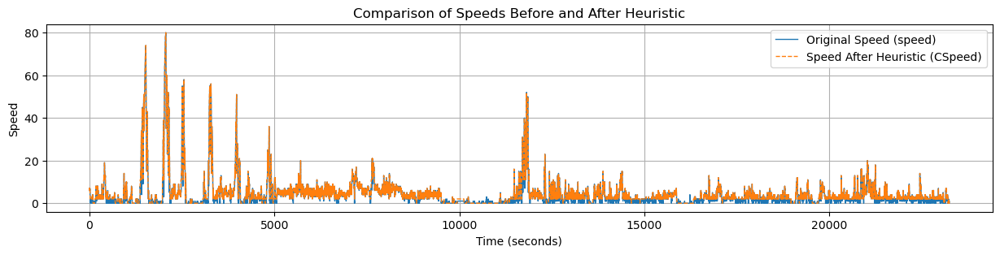

In [8]:
# Load data from the original file
df_original = pd.read_csv('datas/initial_data.csv', sep=';')

# Load data after applying the heuristic
df_heuristic = pd.read_csv('datas/CSpeed_Heuristic1_Result.csv', sep=';')

import matplotlib.pyplot as plt

# Ensure that the indices of both DataFrames serve as the basis for time
plt.figure(figsize=(15, 3))
plt.plot(df_original.index, df_original['speed'], label='Original Speed (speed)', linewidth=1)
plt.plot(df_heuristic.index, df_heuristic['CSpeed'], label='Speed After Heuristic (CSpeed)', linewidth=1, linestyle='--')

plt.xlabel('Time (seconds)')
plt.ylabel('Speed')
plt.title('Comparison of Speeds Before and After Heuristic')
plt.legend()
plt.grid(True)
plt.show()


***Let's zoom in to better visualize the curve***

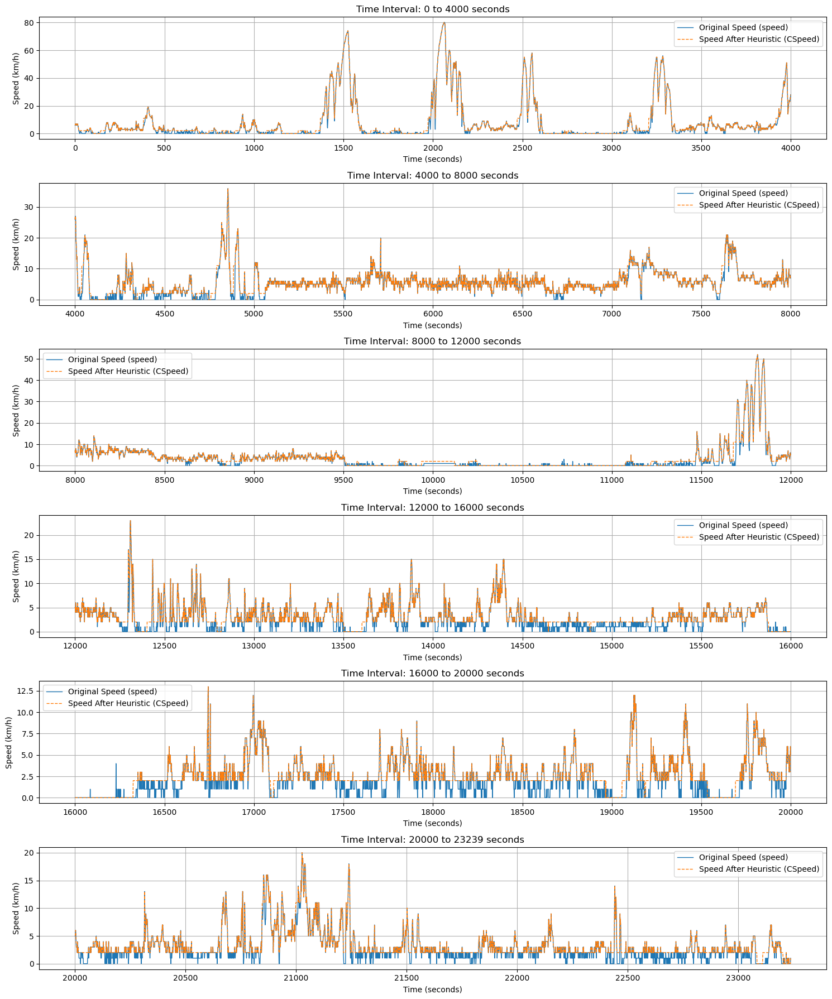

In [9]:

# Load data from the original file
df_original = pd.read_csv('datas/initial_data.csv', sep=';')

# Load data after applying the heuristic
df_heuristic = pd.read_csv('datas/CSpeed_Heuristic1_Result.csv', sep=';')

# Assuming df_original and df_heuristic are already loaded correctly

# Configuration for subplots: 6 subplots, each for an interval of 4000 seconds
fig, axs = plt.subplots(6, 1, figsize=(15, 18))

for i in range(6):
    start = i * 4000
    end = start + 4000
    # Ensure the last subplot includes all remaining data
    if i == 5:
        end = max(df_original.index[-1], df_heuristic.index[-1]) + 1
    
    axs[i].plot(df_original.index[start:end], df_original['speed'][start:end], label='Original Speed (speed)', linewidth=1)
    axs[i].plot(df_heuristic.index[start:end], df_heuristic['CSpeed'][start:end], label='Speed After Heuristic (CSpeed)', linewidth=1, linestyle='--')
    
    axs[i].set_title(f'Time Interval: {start} to {end} seconds')
    axs[i].set_xlabel('Time (seconds)')
    axs[i].set_ylabel('Speed (km/h)')
    axs[i].legend()
    axs[i].grid(True)

plt.tight_layout()
plt.show()


### 4. Manual classification after speed transformation using a smoothing heuristic


The next step is to begin the process of classifying the records into states. We consider this classification as manual, in contrast to the automatic classifications done by ML algorithms.

This classification is based on conventional thresholds determined by examining the distributions of real data. However, their adoption requires validation using video references, which are saved until the states are validated. Thus, the uncertainties generated by this approximate technique will be mitigated during validation by visualizing the corresponding videos.

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  input File : CSpeed_Heuristic1_Result.csv
</div>

In [10]:
# Creating the example DataFrame
df = pd.read_csv('datas/CSpeed_Heuristic1_Result.csv', sep=';')

# Conditions to define the new column
conditions = [
    (df['CSpeed'] >= 10),
    (df['CSpeed'] >= 1) & (df['CSpeed'] < 10),
    (df['CSpeed'] == 0)
]

# Values corresponding to each condition
values = [2, 1, 0]

# Applying the conditions to create the new column
df['State0'] = np.select(conditions, values)
df.to_csv('datas/Manual_Classification_Result.csv', sep=';', index=False)
print(df)


                        Filename   TimeUTC  speed  Distance_Corrected  CSpeed  \
0      2019_0501_145132_801A.MP4  14:51:31      6                 0.0     6.0   
1      2019_0501_145132_801A.MP4  14:51:32      6                 0.0     6.0   
2      2019_0501_145132_801A.MP4  14:51:33      7                 0.0     7.0   
3      2019_0501_145132_801A.MP4  14:51:34      6                 0.0     6.0   
4      2019_0501_145132_801A.MP4  14:51:35      6                 0.0     6.0   
...                          ...       ...    ...                 ...     ...   
23234  2019_0502_015846_969A.MP4  01:59:25      0                35.7     0.0   
23235  2019_0502_015846_969A.MP4  01:59:26      0                35.7     0.0   
23236  2019_0502_015846_969A.MP4  01:59:27      0                35.7     0.0   
23237  2019_0502_015846_969A.MP4  01:59:28      0                35.7     0.0   
23238  2019_0502_015846_969A.MP4  01:59:29      1                35.7     1.0   

       State0  
0          

***Faisons une classification manuelle en se basant sur le vitesse initiale (avant correction par l'heuristique)***

In [11]:
# -*- coding: utf-8 -*-
"""
Created on Thu Feb  8 23:25:43 2024
Manual classification
@author: bendaya
"""
# Création du DataFrame exemple
df4 = pd.read_csv('datas/initial_data.csv', sep=';')

# Conditions pour définir la nouvelle colonne
conditions = [
    (df4['speed'] >= 10),
    (df4['speed'] >= 1) & (df['speed'] < 10),
    (df4['speed'] == 0)]

# Valeurs correspondant à chaque condition
values = [2, 1, 0]

# Application des conditions pour créer la nouvelle colonne
df4['State01'] = np.select(conditions, values)
df4.to_csv('datas/Manual_Classification_Result0.csv', sep=';', index=False)
print(df4)

                        Filename   TimeUTC  speed  Distance_Corrected  State01
0      2019_0501_145132_801A.MP4  14:51:31      6                 0.0        1
1      2019_0501_145132_801A.MP4  14:51:32      6                 0.0        1
2      2019_0501_145132_801A.MP4  14:51:33      7                 0.0        1
3      2019_0501_145132_801A.MP4  14:51:34      6                 0.0        1
4      2019_0501_145132_801A.MP4  14:51:35      6                 0.0        1
...                          ...       ...    ...                 ...      ...
23234  2019_0502_015846_969A.MP4  01:59:25      0                35.7        0
23235  2019_0502_015846_969A.MP4  01:59:26      0                35.7        0
23236  2019_0502_015846_969A.MP4  01:59:27      0                35.7        0
23237  2019_0502_015846_969A.MP4  01:59:28      0                35.7        0
23238  2019_0502_015846_969A.MP4  01:59:29      1                35.7        1

[23239 rows x 5 columns]


***Visualizing State Classification with Speed Before Correction***

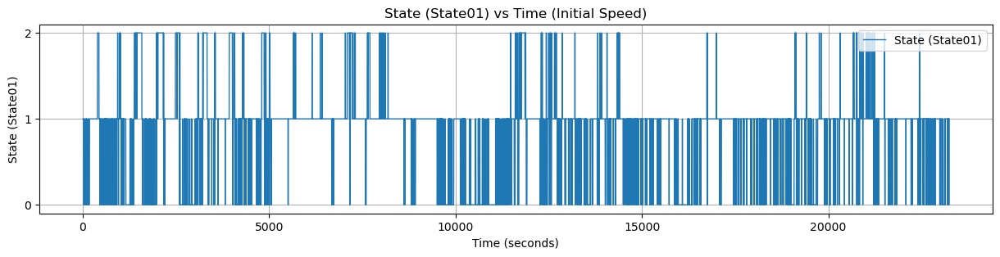

In [12]:

# Load data from the file
df4 = pd.read_csv('datas/Manual_Classification_Result0.csv', sep=';')

# Use the index as an approximation of time
plt.figure(figsize=(15, 3))  # Set the figure size as needed
plt.plot(df4.index, df4['State01'], label='State (State01)', linewidth=1)

plt.xlabel('Time (seconds)')
plt.ylabel('State (State01)')
plt.title('State (State01) vs Time (Initial Speed)')
plt.legend()

# Set the y-axis ticks to display only 0, 1, and 2
plt.yticks([0, 1, 2])

plt.grid(True)
plt.show()


Le résultat de cette première classification est de classifier chaque enregistrement en état selon les seuils de vitesse. Donc une nouvelle colonne est ajoutée qui est State0 (la première classification).

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Output file : Manual_Classification_Result.csv
</div>

#### Visualizing State Classification with Corrected Speed

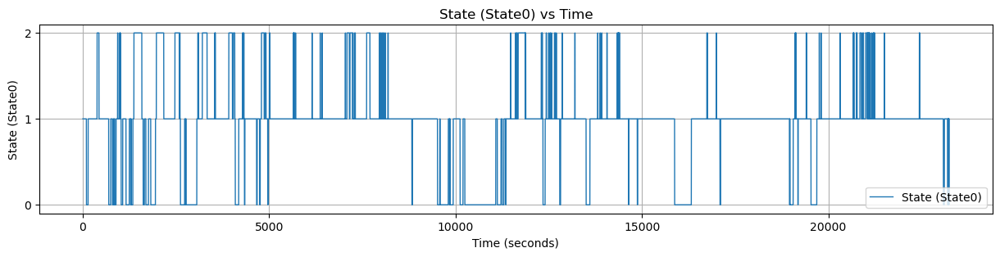

In [13]:
# Load data from the file
df2 = pd.read_csv('datas/Manual_Classification_Result.csv', sep=';')

# Use the index as an approximation of time
plt.figure(figsize=(15, 3))  # Set the figure size as needed
plt.plot(df2.index, df2['State0'], label='State (State0)', linewidth=1)

plt.xlabel('Time (seconds)')
plt.ylabel('State (State0)')
plt.title('State (State0) vs Time')
plt.legend()

# Set the y-axis ticks to display only 0, 1, and 2
plt.yticks([0, 1, 2])

plt.grid(True)
plt.show()


***We notice that the number of states is greatly simplified***

### 5. First Automatic Classification and Confusion Matrix

This classification is based on thresholds. The classic ML algorithm will easily detect these thresholds from the data since it is supervised learning (the goal is to apply multiclass classification knowing the target variable (state)). Our objective is to automate the data processing workflow up to the final classification.

To apply this first classification, the model must be trained on a shift that has undergone manual classification. Since our studied shift can also undergo this manual classification, it can serve as test data to evaluate the performance of the algorithm that will perform this first classification. This is what we will do now. `REF16_QW_train.csv` is a shift that has undergone manual classification and will be used to train the classification model, while `Manual_Classification_Result.csv` is the studied case that will be used to test the trained model for evaluation.

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
<p> train_data = 'REF16_QW_train.csv'
<p> test_data = 'Manual_Classification_Result.csv'
</div>

Accuracy: 0.9996557511080512
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3547
           1       1.00      1.00      1.00     17851
           2       1.00      1.00      1.00      1841

    accuracy                           1.00     23239
   macro avg       1.00      1.00      1.00     23239
weighted avg       1.00      1.00      1.00     23239



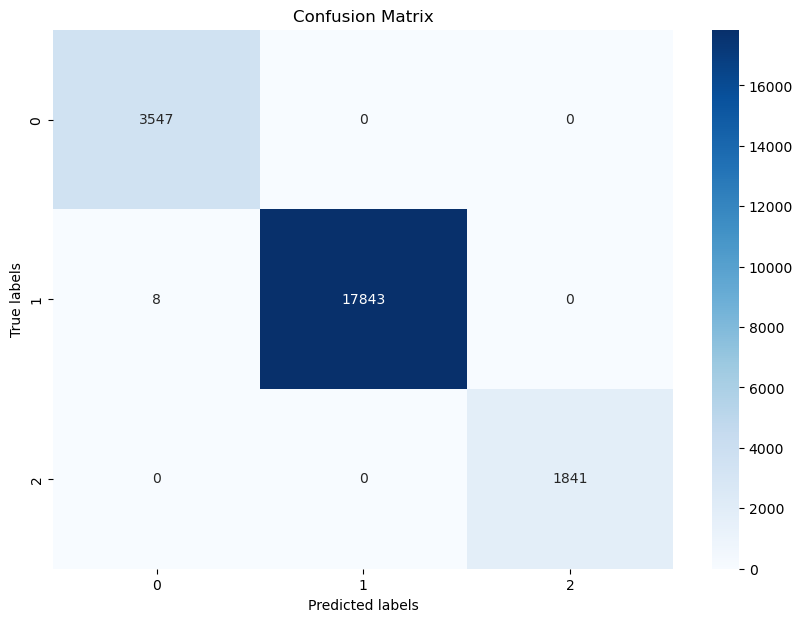

In [14]:

# Loading the data
train_data = pd.read_csv('datas/REF16_QW_train.csv', sep=';')
test_data = pd.read_csv('datas/Manual_Classification_Result.csv', sep=';')

# Preparing the data
X_train = train_data[['CSpeed']]
y_train = train_data['State0']
X_test = test_data[['CSpeed']]
y_test = test_data['State0']

# Training the model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Predictions
predictions = model.predict(X_test)

# Model evaluation
accuracy = accuracy_score(y_test, predictions)
print(f'Accuracy: {accuracy}')
conf_matrix = confusion_matrix(y_test, predictions)
class_report = classification_report(y_test, predictions)
print(f'Classification Report:\n{class_report}')

# Displaying the confusion matrix as a heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=model.classes_, yticklabels=model.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()


Excellent! Our model (LogisticRegression) made 8 classification errors out of 23,239 records (8 records were considered idle when they were actually sweeping states). Thus, our model is highly effective, achieving a 99.99% accuracy in predicting the states of our case study by training on another work shift. However, this classification is insufficient because the number of generated states far exceeds the actual number. Many states are of short duration, and others interfere with the underlying states:

- Sweeping at high speed exceeding the sweeping threshold toward the movement speed or touching the idle state speed threshold in the case of low-speed sweeping.
- GPS error, which transforms an idle state into a sweeping state.
- Movement in city traffic where the sweeper stops at traffic lights (idle speed), accelerates (leaving the traffic light), or decelerates (approaching the traffic light), giving it sweeping speed.

### 6. First Classification: Prediction

Our model (LogisticRegression) has been tested, and we will use it to predict the states for our work shift, the subject of this study.

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Input file  : Manual_Classification_Result.csv
</div>

In [15]:
# Loading the training and test data
train_data = pd.read_csv('datas/REF16_QW_train.csv', sep=';')
test_data = pd.read_csv('datas/Manual_Classification_Result.csv', sep=';')

# Selecting the predictive variable and the target variable
X_train = train_data[['CSpeed']]
y_train = train_data['State0']
X_test = test_data[['CSpeed']]

# Creating and training the logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Predicting the states on the test set
test_data['State_1predict'] = model.predict(X_test)

# Saving the modified test DataFrame to a new CSV file
test_data.to_csv('datas/First_Prediction_Result.csv', sep=';', index=False)

# If necessary, display part of the DataFrame to check the new predictions
print(test_data.head())


                    Filename   TimeUTC  speed  Distance_Corrected  CSpeed  \
0  2019_0501_145132_801A.MP4  14:51:31      6                 0.0     6.0   
1  2019_0501_145132_801A.MP4  14:51:32      6                 0.0     6.0   
2  2019_0501_145132_801A.MP4  14:51:33      7                 0.0     7.0   
3  2019_0501_145132_801A.MP4  14:51:34      6                 0.0     6.0   
4  2019_0501_145132_801A.MP4  14:51:35      6                 0.0     6.0   

   State0  State_1predict  
0       1               1  
1       1               1  
2       1               1  
3       1               1  
4       1               1  


***State_1predict*** is the classification predicted by our LogisticRegression model

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Output file : First_Prediction_Result.csv
</div>

### 7. First Aggregation

After classification, we need to aggregate adjacent states of the same type, which will generate new attributes, primarily the duration, which is initially equal to one second for all records. For this reason, this attribute did not serve as a predictor for the first classification.

The first classification functioned as a feature engineering tool to provide us with new predictive variables, such as the initial state and duration.

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Input file : First_Prediction_Result.csv
</div>

In [16]:
# Load the DataFrame from a CSV file
df = pd.read_csv('datas/First_Prediction_Result.csv', sep=';')

# Mark rows where the state changes compared to the previous row
df['StateChange'] = df['State0'].diff().ne(0).cumsum()

# For calculating the distance, we need to identify the first and the last record in each group
df['FirstRecordDistance'] = df.groupby('StateChange')['Distance_Corrected'].transform('first')
df['LastRecordDistance'] = df.groupby('StateChange')['Distance_Corrected'].transform('last')

# Calculate the distance for each state aggregation
df['CalculatedDistance'] = df['LastRecordDistance'] - df['FirstRecordDistance']

# Aggregate by state sequences to calculate new duration, average speed, and distance
aggregated_df = df.groupby(['StateChange', 'State0']).agg(
    Duration=('State0', 'size'),  # Count of rows in each group represents the duration
    AvgSpeed=('speed', 'mean'),  # Calculate the mean speed of rows in each group
    TotalDistance=('CalculatedDistance', 'first')  # Distance for the group is the first value since all values in the group are the same
).reset_index()

# Correct the renaming part. Make sure 'State0' column is present and then rename it.
# It seems the previous attempt to drop 'StateChange' during reset_index caused confusion.
# Here, we directly rename 'State0' to 'State' after reset_index without dropping 'StateChange'.
aggregated_df = aggregated_df.rename(columns={'State0': 'State', 'TotalDistance': 'Distance'})

# Now, when selecting columns, ensure that the renamed columns are correctly referenced.
final_df = aggregated_df[['Distance', 'Duration', 'AvgSpeed', 'State']]

# Save the final DataFrame to a new CSV file
final_df.to_csv('datas/Aggregated_States_Result9fev2024.csv', sep=';', index=False)

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Output file : Aggregated_States_Result9fev2024.csv
</div>

***Visualization of States After First Classification***

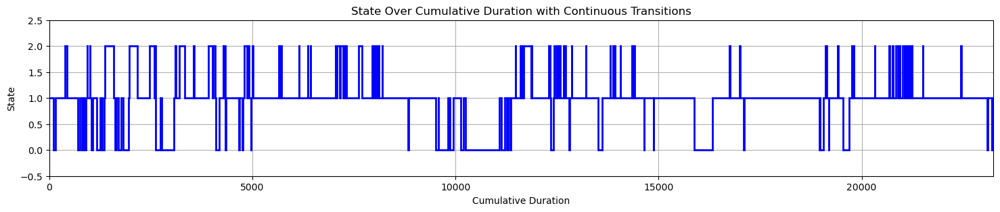

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('datas/Aggregated_States_Result9fev2024.csv', sep=';')

plt.figure(figsize=(18, 3))  # Adjust the figure size

# Initialize the start time to zero
start_time = 0

for index, row in df.iterrows():
    end_time = start_time + row['Duration']
    # Horizontal line for the current state
    plt.hlines(row['State'], start_time, end_time, colors='blue', linewidth=2)
    # Continuous line for the transition between states
    if index > 0:
        plt.plot([start_time, start_time], [df.iloc[index - 1]['State'], row['State']], color='blue', linewidth=2)
    start_time = end_time

# Set the labels and titles of the axes
plt.xlabel('Cumulative Duration')
plt.ylabel('State')
plt.title('State Over Cumulative Duration with Continuous Transitions')

# Add a grid for better readability
plt.grid(True)

# Set the axis limits for better segment visualization
plt.xlim(0, start_time)  # Use 'start_time' which represents the total duration at the end of the loop
plt.ylim(df['State'].min() - 0.5, df['State'].max() + 0.5)  # Add some space around the min/max states

# Display the plot
plt.show()


We notice that the number of states is significant (> 300), whereas, in reality, this number should be less than 50 states in a work shift. Therefore, interferences still need to be addressed. Hence, there is a need for a new classification that can benefit from the first one in the sense that the number of predictors will increase from 1 (speed) to 3 (initial state, speed, duration). This is the true manifestation of feature engineering.

### 8.  Second classification 

Our multi-classification model is RandomForest, which will be trained on the data from the work shift in `Aggregated_States_Result9fev2024.csv` to predict the states of our case study.

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
<p> prediction_data = 'Aggregated_States_Result9fev2024.csv
<p> train_data =  REF16_S2_train2Classif.csv
</div>

In [18]:

from sklearn.ensemble import RandomForestClassifier

# Load the training data
train_data = pd.read_csv('datas/REF16_S2_train2Classif.csv', sep=';')

# Separate the predictors and the target variable
X_train = train_data[['State', 'Duration', 'AvgSpeed']]
y_train = train_data['State_target']

# Load the prediction data
prediction_data = pd.read_csv('datas/Aggregated_States_Result9fev2024.csv', sep=';')
X_predict = prediction_data[['State', 'Duration', 'AvgSpeed']]

# Train the RandomForest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Prediction
prediction_data['State_Predict'] = rf_model.predict(X_predict)
prediction_data.to_csv('datas/Classification2_Result9fev2024.csv', sep=';', index=False)

# Optional display of a few predictions
prediction_data.head()


,Distance,Duration,AvgSpeed,State,State_Predict
0,0.1,97,2.206186,1,1
1,0.0,46,0.152174,0,0
2,0.3,240,3.616667,1,1
3,0.2,51,12.549020,2,1
4,0.2,261,1.501916,1,1


After prediction and adding a column for the second classification (State_Predict), we will perform an aggregation to group adjacent states of the same type, just as we did following the first classification.

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Output file : Classification2_Result9fev2024.csv
</div>

### 9. Second Aggregation

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Input file : Classification2_Result9fev2024.csv
</div>

In [19]:
import pandas as pd

# Load the prediction data
df = pd.read_csv('datas/Classification2_Result9fev2024.csv', sep=';')

# Mark the changes in predicted state to identify unique sequences
df['StateChange'] = df['State_Predict'].diff().ne(0).cumsum()

# Calculate the weighted average speed and the sum of distances for each group
aggregated_df = df.groupby('StateChange').apply(lambda x: pd.Series({
    'State': x['State_Predict'].iloc[0],  # The predicted state for the group
    'Duration': x['Duration'].sum(),  # The sum of durations for the group
    'AvgSpeed': (x['AvgSpeed'] * x['Duration']).sum() / x['Duration'].sum(),  # Weighted average speed
    'Distance': x['Distance'].sum()  # The sum of distances for the group
})).reset_index(drop=True)

# Save the aggregated DataFrame to a new CSV file
aggregated_df.to_csv('datas/Aggr_Clas2_Result9fev2024.csv', sep=';', index=False)

# Display the aggregated DataFrame for verification
print(aggregated_df.head())


   State  Duration  AvgSpeed  Distance
0    1.0      97.0  2.206186       0.1
1    0.0      46.0  0.152174       0.0
2    1.0     606.0  3.160066       0.7
3    0.0      46.0  0.934783       0.0
4    1.0      25.0  0.160000       0.0


C:\Users\bendaya\AppData\Local\Temp\ipykernel_8204\179478136.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  aggregated_df = df.groupby('StateChange').apply(lambda x: pd.Series({


<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Output file : Aggr_Clas2_Result9fev2024.csv
</div>

### Visualization of the Second Aggregation

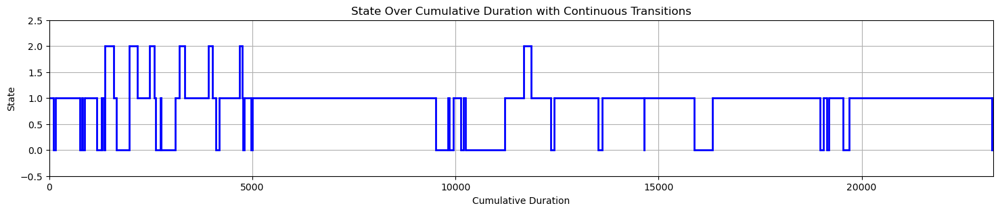

In [20]:

import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('datas/Aggr_Clas2_Result9fev2024.csv', sep=';')

# Initialize the start time to zero
start_time = 0

# Calculate cumulative duration
df['CumulativeDuration'] = df['Duration'].cumsum()

plt.figure(figsize=(18, 3))  # Adjust the figure size

# Plot the state over cumulative duration
for index, row in df.iterrows():
    end_time = start_time + row['Duration']
    plt.hlines(row['State'], start_time, end_time, colors='blue', linewidth=2)
    if index > 0:
        plt.plot([start_time, start_time], [df.iloc[index - 1]['State'], row['State']], color='blue', linewidth=2)
    start_time = end_time

# Set the labels and titles of the axes
plt.xlabel('Cumulative Duration')
plt.ylabel('State')
plt.title('State Over Cumulative Duration with Continuous Transitions')

# Add a grid for better readability
plt.grid(True)

# Set the axis limits for better segment visualization
plt.xlim(0, df['CumulativeDuration'].iloc[-1])
plt.ylim(df['State'].min() - 0.5, df['State'].max() + 0.5)

# Display the plot
plt.show()


We notice that the number of states has significantly decreased. However, some states with short durations still exist. By estimation or hypothesis, we will assume that states with a duration of less than one minute should be reclassified with the adjacent states having the longest duration. 

To achieve this, a heuristic will be applied to perfect the objective of reclassifying these short-duration states.

### 10. Applying a Correction Heuristic


<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Fichier d'entrée : Aggr_Clas2_Result9fev2024.csv
</div>

In [21]:

import pandas as pd

def CorrectHeuristic(file_path):
    df = pd.read_csv(file_path, sep=';')
    
    # Initialize the corrected states column. 'CumulativeDuration' is used for the correction logic.
    df['CorrectedState'] = df['State']
    df['CumulativeDuration'] = df['Duration']
    
    for i in range(1, len(df) - 1):  # Exclude the last element to avoid index out of range
        if df.at[i, 'Duration'] < 60:
            prev_cumulative_duration = df.at[i - 1, 'CumulativeDuration']
            next_duration = df.at[i + 1, 'Duration']
            
            # Determine if the correction should be based on the previous or next state
            if prev_cumulative_duration > next_duration:
                # Correction based on the previous state
                df.at[i, 'CorrectedState'] = df.at[i - 1, 'CorrectedState']
                # Update the cumulative duration to include this state
                df.at[i, 'CumulativeDuration'] = prev_cumulative_duration + df.at[i, 'Duration']
                # Update the cumulative duration of the next state
                if i < len(df) - 2:  # Ensure the next index is within bounds
                    df.at[i + 1, 'CumulativeDuration'] = df.at[i, 'CumulativeDuration']
            else:
                # Correction based on the next state, without modifying the cumulative duration
                df.at[i, 'CorrectedState'] = df.at[i + 1, 'State']
    
    # Remove the 'CumulativeDuration' column before saving, as it is not intended for the output state
    df.drop(columns=['CumulativeDuration'], inplace=True)
    
    # Save the final result without the 'CumulativeDuration' column
    df.to_csv('datas/Cor_H2_Result9fev2024.csv', sep=';', index=False)
    print(df)

# Example usage
file_path = 'datas/Aggr_Clas2_Result9fev2024.csv'
CorrectHeuristic(file_path)


    State  Duration  AvgSpeed  Distance  CorrectedState
0     1.0      97.0  2.206186       0.1             1.0
1     0.0      46.0  0.152174       0.0             1.0
2     1.0     606.0  3.160066       0.7             1.0
3     0.0      46.0  0.934783       0.0             1.0
4     1.0      25.0  0.160000       0.0             1.0
..    ...       ...       ...       ...             ...
65    0.0       1.0  1.000000       0.0             1.0
66    1.0       3.0  0.000000       0.0             1.0
67    0.0       1.0  1.000000       0.0             1.0
68    1.0       7.0  0.000000       0.0             1.0
69    0.0       1.0  1.000000       0.0             0.0

[70 rows x 5 columns]


<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Fichier de sortie : Cor_H2_Result9fev2024.csv
</div>

### 11.  Final Aggregation

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Fichier entrée : Cor_H2_Result9fev2024.csv
</div>

In [22]:
import pandas as pd

def AggregateCorrectedStates(file_path):
    df = pd.read_csv(file_path, sep=';')
    
    # Identify groups of adjacent states using 'CorrectedState'
    df['StateGroup'] = (df['CorrectedState'] != df['CorrectedState'].shift()).cumsum()
    
    # Perform aggregation
    aggregated_df = df.groupby('StateGroup').agg(
        Duration=('Duration', 'sum'),
        AvgSpeed=('AvgSpeed', 'mean'),
        Distance=('Distance', 'sum'),
        CorrectedState=('CorrectedState', 'first')
    ).reset_index(drop=True)
    
    # Calculate the weighted average of AvgSpeed correctly
    aggregated_df['WeightedAvgSpeed'] = df.groupby('StateGroup').apply(
        lambda x: (x['AvgSpeed'] * x['Duration']).sum() / x['Duration'].sum()
    ).values
    
    # Remove the incorrect AvgSpeed column and rename WeightedAvgSpeed to AvgSpeed
    aggregated_df.drop(columns=['AvgSpeed'], inplace=True)
    aggregated_df.rename(columns={'WeightedAvgSpeed': 'AvgSpeed'}, inplace=True)
    
    # Check and adjust the last record if necessary
    if len(aggregated_df) > 1 and aggregated_df.iloc[-1]['Duration'] < 60:
        # Assign the duration, distance, and recalculate the weighted average speed for the second last state
        last_row = aggregated_df.iloc[-1]
        second_last_row = aggregated_df.iloc[-2]
        
        # Adjust the second last row
        new_duration = second_last_row['Duration'] + last_row['Duration']
        new_distance = second_last_row['Distance'] + last_row['Distance']
        new_avg_speed = ((second_last_row['AvgSpeed'] * second_last_row['Duration']) + 
                         (last_row['AvgSpeed'] * last_row['Duration'])) / new_duration
        
        aggregated_df.iloc[-2] = pd.Series({
            'Duration': new_duration,
            'Distance': new_distance,
            'CorrectedState': second_last_row['CorrectedState'],
            'AvgSpeed': new_avg_speed
        })
        
        # Remove the last row
        aggregated_df = aggregated_df[:-1]
    
    # Save the aggregated DataFrame to a new CSV file
    aggregated_df.to_csv('datas/Aggregated_Cor_H2_Result9fev2024.csv', sep=';', index=False)
    
    print(aggregated_df)

# Example usage
file_path = 'datas/Cor_H2_Result9fev2024.csv'
AggregateCorrectedStates(file_path)


    Duration  Distance  CorrectedState   AvgSpeed
0     1159.0       1.1             1.0   2.545298
1      184.0       0.1             0.0   0.195652
2      241.0       2.1             2.0  31.489627
3       69.0       0.1             1.0   1.623188
4      320.0       0.1             0.0   0.287500
5      199.0       2.3             2.0  41.648241
6      299.0       0.5             1.0   4.538462
7      117.0       1.0             2.0  28.974359
8      502.0       0.2             0.0   0.436255
9      116.0       0.1             1.0   2.948276
10     128.0       1.2             2.0  32.609375
11     583.0       0.9             1.0   4.435678
12      96.0       0.7             2.0  23.604167
13      77.0       0.2             1.0   7.922078
14      93.0       0.0             0.0   0.129032
15     495.0       0.5             1.0   2.662626
16      82.0       0.1             2.0   0.817073
17    4755.0       8.7             1.0   5.536909
18     422.0       0.2             0.0   0.208531


C:\Users\bendaya\AppData\Local\Temp\ipykernel_8204\3461751204.py:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  aggregated_df['WeightedAvgSpeed'] = df.groupby('StateGroup').apply(


<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Fichier de sortie : Aggregated_Cor_H2_Result9fev2024
</div>


### 12. State Curve Over Time: Reconstitution of the Work Shift 

<div style="background-color: #CCF0F0; color: blue; padding: 10px;">
  Fichier entrée : Aggregated_Cor_H2_Result9fev2024
</div>

In [23]:

# Load data from the DataFrame
df = pd.read_csv('datas/Aggregated_Cor_H2_Result9fev2024.csv', sep=';')

# Prepare the data for the graph
# Add a row at the beginning at 0 to start the graph
start_row = pd.DataFrame({'Duration': [0], 'CorrectedState': [df.iloc[0]['CorrectedState']]})
df = pd.concat([start_row, df]).reset_index(drop=True)

# Calculate the cumulative duration and the start time for each state
df['CumulativeDuration'] = df['Duration'].cumsum()
df['StartTime'] = df['CumulativeDuration'] - df['Duration']

# Create lists for start and end points
times = []
states = []

# Add start and end points for each state
for index, row in df.iterrows():
    # If it's not the first state, add a point for the end of the last state
    if index > 0:
        times.append(df.at[index - 1, 'CumulativeDuration'])
        states.append(df.at[index - 1, 'CorrectedState'])
    # Add a point for the start of the current state
    times.append(row['StartTime'])
    states.append(row['CorrectedState'])

# Add a point for the end of the last state
times.append(df.iloc[-1]['CumulativeDuration'])
states.append(df.iloc[-1]['CorrectedState'])

# Create the graph with Plotly
fig = go.Figure()

# Add a trace for the corrected states over cumulative duration
fig.add_trace(go.Scatter(x=times, y=states, mode='lines', line=dict(color='RoyalBlue', width=3)))

# Adjust the graph proportions
fig.update_layout(
    title='Corrected States Over Time',
    xaxis_title='Time (seconds)',
    yaxis_title='Corrected State',
    yaxis=dict(tickmode='array', tickvals=[0, 1, 2]),
    template='plotly_white',
    width=960,  # Adjust width for an 8:2 ratio
    height=240  # Adjust height for an 8:2 ratio
)

# Verify the last states

# Display the graph
#fig.show(renderer='browser')
fig.show()


In [24]:
df.shape

(35, 6)

We observe that there are 35 states distributed among sweeping, idle, and moving, with varying durations and frequencies.

### 13. Evolution of Transformation, Classification, and Aggregation Steps from Initial Geolocation Data to Sweeping Behavior Data by States: Idle, Moving, and Sweeping

In [25]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Chargement des données
df1 = pd.read_csv('datas/initial_data.csv', sep=';')
df2 = pd.read_csv('datas/CSpeed_Heuristic1_Result.csv', sep=';')
df3 = pd.read_csv('datas/Manual_Classification_Result0.csv', sep=';')
df4 = pd.read_csv('datas/Manual_Classification_Result.csv', sep=';')
df5 = pd.read_csv('datas/Aggregated_States_Result9fev2024.csv', sep=';')
df6 = pd.read_csv('datas/Aggr_Clas2_Result9fev2024.csv', sep=';')
df7 = pd.read_csv('datas/Aggregated_Cor_H2_Result9fev2024.csv', sep=';')
df8 = pd.read_csv("datas/REF2_paper_def.csv", sep=';')

# Calcul du maximum des indices pour définir la longueur du DataFrame consolidé
max_index = max(
    df1.index.max(), df2.index.max(), df3.index.max(), df4.index.max(),
    df5['Duration'].cumsum().max(), df6['Duration'].cumsum().max(),
    df7['Duration'].cumsum().max(), df8.index.max()
)

# Création du DataFrame consolidé
consolidated_df = pd.DataFrame(index=np.arange(max_index + 1))

# Ajout des données de vitesse et d'état directes
consolidated_df['Speed_df1'] = df1['speed']
consolidated_df['CSpeed_df2'] = df2['CSpeed']
consolidated_df['State01_df3'] = df3['State01']
consolidated_df['State0_df4'] = df4['State0']
consolidated_df['States_REAL_df8'] = df8['States_REAL']

# Fonction pour étaler les états sur leur durée
def spread_states(consolidated_df, df, column_name, state_column):
    current_index = 0
    for _, row in df.iterrows():
        end_index = current_index + row['Duration']
        consolidated_df.loc[current_index:end_index, column_name] = row[state_column]
        current_index = end_index
    return consolidated_df

# Étaler les états sur leur durée pour df5, df6, et df7
consolidated_df = spread_states(consolidated_df, df5, 'State_df5', 'State')
consolidated_df = spread_states(consolidated_df, df6, 'State_df6', 'State')
consolidated_df = spread_states(consolidated_df, df7, 'CorrectedState_df7', 'CorrectedState')

# Remplissage des valeurs NaN
consolidated_df.ffill(inplace=True)

# Suppression de la colonne 'State0_df4'
consolidated_df.drop(columns=['State0_df4'], inplace=True)

# Réorganisation des colonnes pour intervertir "First classification" et "Second classification"
consolidated_df = consolidated_df[['Speed_df1', 'CSpeed_df2', 'State01_df3', 'State_df5', 'State_df6', 'CorrectedState_df7', 'States_REAL_df8']]

# Visualisation avec Plotly
fig = make_subplots(rows=7, cols=1, shared_xaxes=True, vertical_spacing=0.02,
                    subplot_titles=("Initial Speed (IS)", "Corrected Speed (CS)", "States using IS",
                                    "First Classification", "Second classification", "Heuristic Correction", "Real States"))

# Ajout des traces avec des noms personnalisés
legends = ["Initial speed (IS)", "Corrected speed (CS)", "States using IS", 
           "Second Classification", "First classification", "Heuristic Correction", "Real states"]

for i, (col, legend) in enumerate(zip(consolidated_df.columns, legends), start=1):
    fig.add_trace(go.Scatter(x=consolidated_df.index, y=consolidated_df[col], mode='lines', name=legend), row=i, col=1)

# Ajustement des marques de l'axe des y pour correspondre à 0, 1, 2 et ajustement des étiquettes
for i in range(1, 6):  # Pour les premiers 5 graphiques représentant des états
    fig.update_yaxes(title_text="States (W,S,M)", row=i, col=1, tickvals=[0, 1, 2])

# Ajustement spécifique pour le dernier graphique (vitesse)
fig.update_yaxes(title_text="Speed (Km/h)", row=6, col=1)

# Ajustement de l'étiquette de l'axe des abscisses pour le dernier graphique
fig.update_xaxes(title_text="Duration (Seconds)", row=7, col=1)

# Mise à jour du layout général
fig.update_layout(height=1600, width=1000, title_text="Consolidated Data Visualization")

fig.show()


### 14. Classification Evaluation

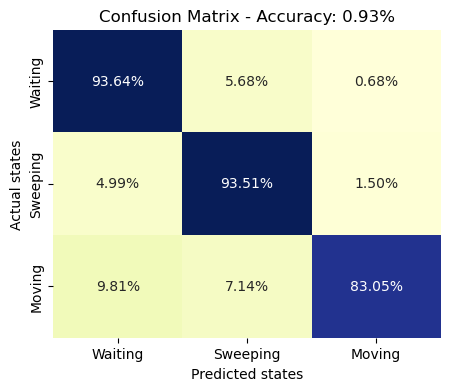

In [26]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score

# Example mapping (make sure this matches your use case)
# state_mapping = {0: 'Waiting', 1: 'Sweeping', 2: 'Moving'}
# Inverse mapping for conversion
# inverse_state_mapping = {'Waiting': 0, 'Sweeping': 1, 'Moving': 2}

# Calculate accuracy
accuracy = accuracy_score(consolidated_df['CorrectedState_df7'], consolidated_df['States_REAL_df8'])

# Calculate the confusion matrix
conf_matrix = confusion_matrix(consolidated_df['CorrectedState_df7'], consolidated_df['States_REAL_df8'])

# Convert the confusion matrix to percentages
conf_matrix_percentage = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Format the annotated values as percentages in a Numpy array
annot = np.array([["{:.2f}%".format(val * 100) for val in row] for row in conf_matrix_percentage])

# Visualize the confusion matrix with Seaborn
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_percentage, annot=annot, fmt="", cmap="YlGnBu", cbar=False,
            xticklabels=["Waiting", "Sweeping", "Moving"], yticklabels=["Waiting", "Sweeping", "Moving"])  # Use labels
plt.title(f"Confusion Matrix - Accuracy: {accuracy:.2f}%")
plt.xlabel("Predicted states")
plt.ylabel("Actual states")
plt.show()


#### The accuracy is good (93%). However, there are still opportunities for improvement to reduce prediction errors.

# How to produce simulation parameters?

After the final classification, we were able to replicate the sweeping behavior with 93% accuracy. How can we simulate this behavior? We simply need to determine parameters that allow us to generate states (waiting, sweeping, and moving) with a frequency and magnitude comparable to the real or predicted data.

***Three key parameters to simulate sweeping behavior:***
- The frequency of states (the number of occurrences of a particular state compared to the total number of different states in a shift or a set of shifts).
- The duration of these states (average duration or distribution of duration according to the most suitable distribution).
- Sweep speed for sweeping and movement (average speed or speed distribution).

Distributions will be determined after aggregating a large number of shifts, thus obtaining a significant number of observations for the relevant variables (speed, duration, and frequency).

# Simulation model design

Our simulation model will use:
- The frequency of states as probabilities to generate these states randomly.
- For each generated state, it will assign a stochastic duration according to the probability distribution of the corresponding state.
- A stochastic speed according to the probability distribution related to the corresponding state (for waiting, the speed will be zero).
- At the end of the duration of the current state, the simulation system automatically generates states in a loop until the end of the shift.

This operation will be replicated as many times as necessary until the parameters converge to their mean. This number of replicas will be adopted to generate the simulation results for analysis.

# End